In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
import timesfm

 See https://github.com/google-research/timesfm/blob/master/README.md for updated APIs.


d:\Manchester\ERP\Code\AdvancedLLM\venv_chronos\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loaded PyTorch TimesFM, likely because python version is 3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)].


In [3]:
# Load data
top_50_df = pd.read_csv("top50_estimation.csv")
top_50_out_df = pd.read_csv("top50_outofsample.csv")

# Settings
TARGET = 'EXCESS_RET'
PRED_HORIZON = 12
results = []

# Load TimeFM model once
model = timesfm.TimesFm(
    hparams=timesfm.TimesFmHparams(
        backend="cpu",
        per_core_batch_size=1,
        horizon_len=PRED_HORIZON,
        input_patch_len=32,
        output_patch_len=128,
        num_layers=50,
        model_dims=1280,
        use_positional_embedding=False
    ),
    checkpoint=timesfm.TimesFmCheckpoint(
        huggingface_repo_id="google/timesfm-2.0-500m-pytorch"
    )
)

# Loop through each stock
permnos = top_50_out_df['PERMNO'].unique()

for permno in permnos:
    try:
        # Train/test split
        df_train = top_50_df[top_50_df['PERMNO'] == permno].sort_values("date").copy()
        df_test = top_50_out_df[top_50_out_df['PERMNO'] == permno].sort_values("date").copy()

        # Drop NaNs
        df_train = df_train.dropna(subset=[TARGET])
        df_test = df_test.dropna(subset=[TARGET])

        # Check data sufficiency
        if len(df_train) < 32 or len(df_test) < PRED_HORIZON:
            continue

        # Prepare training input for TimeFM
        df_input = pd.DataFrame({
            "unique_id": permno,
            "ds": pd.to_datetime(df_train["date"]),
            "y": df_train[TARGET].astype('float32')
        })

        # Forecast using training only
        forecast_df = model.forecast_on_df(
            inputs=df_input,
            freq="D",
            value_name="y",
            num_jobs=-1
        )

        # Get last forecast values and first test values (by position)
        predicted = forecast_df["timesfm"].values[-PRED_HORIZON:]
        actual = df_test[TARGET].values[:PRED_HORIZON]
        dates = pd.to_datetime(df_test["date"].values[:PRED_HORIZON])

        # Directional accuracy
        def directional_accuracy(y_true, y_pred):
            return np.mean(np.sign(np.diff(y_true)) == np.sign(np.diff(y_pred)))

                # R2 out-of-sample
        baseline = df_train[TARGET].mean()
        ss_res = np.sum((actual - predicted) ** 2)
        ss_tot = np.sum((actual - baseline) ** 2)
        r2_out = 1 - ss_res / ss_tot if ss_tot != 0 else np.nan

        # Store results
        results.append({
            "PERMNO": permno,
            "R2": r2_score(actual, predicted),
            "R2_out_of_sample": r2_out,
            "MSE": mean_squared_error(actual, predicted),
            "Directional Accuracy": directional_accuracy(actual, predicted),
            "plot_data": pd.DataFrame({
                "ds": dates,
                "actual": actual,
                "forecast": predicted
            })
        })


    except Exception as e:
        print(f"Skipped PERMNO {permno} due to error: {e}")



Fetching 5 files: 100%|██████████| 5/5 [00:00<00:00, 4995.60it/s]


Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Fi

In [9]:
avg_market_caps = (
    top_50_df.groupby('PERMNO')['MKT_CAP']
    .mean()
    .sort_values(ascending=False)
)

display((avg_market_caps))

top_n = max(1, int(len(avg_market_caps) * 0.1))

# Get top 10% PERMNOs
top_10_pct_permnos = avg_market_caps.sort_values(ascending=False).head(top_n).index.tolist()
# Get top 10% PERMNOs
min_10_pct_permnos = avg_market_caps.sort_values(ascending=True).head(top_n).index.tolist()

print("Top 10% PERMNOs by Market Cap:", top_10_pct_permnos)
print("Top 10% PERMNOs by Market Cap:", min_10_pct_permnos)

PERMNO
66093    1.525569e+11
76226    3.595558e+10
29647    2.611607e+10
78405    1.118811e+10
86339    1.055632e+10
81696    7.598825e+09
78840    7.298822e+09
80924    7.229011e+09
80089    6.775381e+09
85991    6.431542e+09
86218    6.293792e+09
68857    5.442989e+09
86996    4.300831e+09
85421    3.685955e+09
75049    3.578480e+09
83604    3.376114e+09
75104    3.168778e+09
63773    2.881172e+09
86869    2.862269e+09
75320    2.501611e+09
81043    1.828247e+09
80863    1.680567e+09
47677    1.403899e+09
87075    1.154848e+09
85425    8.716167e+08
87255    8.424249e+08
86560    8.418272e+08
66835    7.894038e+08
81740    7.215712e+08
81133    5.610599e+08
86155    5.065920e+08
80297    4.760784e+08
12173    4.420072e+08
83989    3.138813e+08
78971    3.003444e+08
87373    2.848481e+08
11174    2.269973e+08
87121    2.182236e+08
79033    2.037563e+08
87339    1.817428e+08
87342    1.671391e+08
86916    1.621737e+08
39731    5.290920e+07
Name: MKT_CAP, dtype: float64

Top 10% PERMNOs by Market Cap: [66093, 76226, 29647, 78405]
Top 10% PERMNOs by Market Cap: [39731, 86916, 87342, 87339]


    PERMNO     R2  R2_out_of_sample    MSE  Directional Accuracy
22   81133  0.015             0.089  0.000                 0.545
17   80089  0.013             0.043  0.000                 0.636
12   76226  0.000             0.004  0.001                 0.545
42   87373 -0.001             0.056  0.001                 0.545
7    66835 -0.006             0.009  0.000                 0.455
6    66093 -0.008             0.008  0.000                 0.364
8    68857 -0.008             0.002  0.000                 0.455
13   78405 -0.010             0.000  0.000                 0.364
31   86218 -0.013             0.026  0.000                 1.000
15   78971 -0.021            -0.008  0.001                 0.364
28   85425 -0.026            -0.022  0.000                 0.364
35   86916 -0.037             0.009  0.001                 0.636
34   86869 -0.042             0.006  0.000                 0.455
21   81043 -0.049            -0.026  0.000                 0.273
10   75104 -0.053        

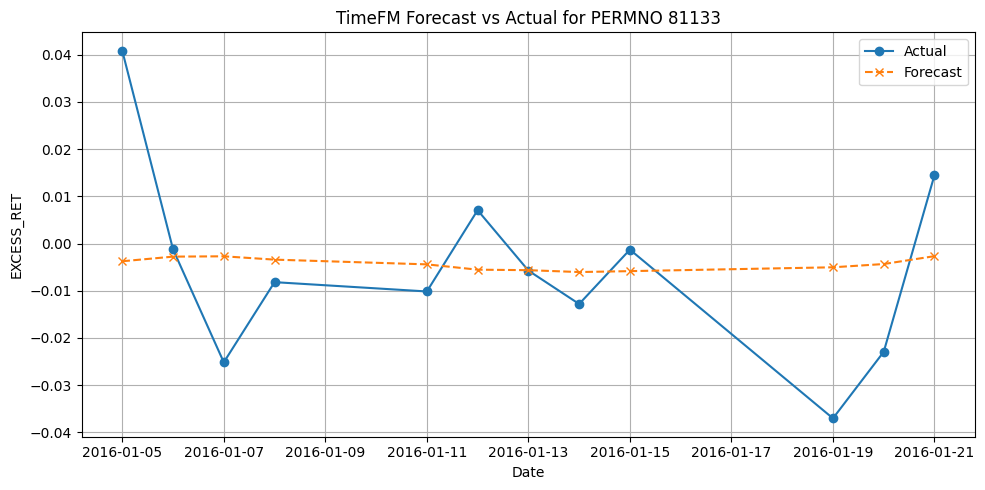

In [ ]:
# Summary results
results_df = pd.DataFrame([{k: v for k, v in r.items() if k != "plot_data"} for r in results])

# --- Plot best PERMNO ---
top_result = max(results, key=lambda x: x["R2"])
permno = top_result["PERMNO"]
plot_df = top_result["plot_data"]

plt.figure(figsize=(10, 5))
plt.plot(plot_df["ds"], plot_df["actual"], label="Actual", marker='o')
plt.plot(plot_df["ds"], plot_df["forecast"], label="Forecast", linestyle='--', marker='x')
plt.title(f"TimeFM Forecast vs Actual for PERMNO {int(permno)}")
plt.xlabel("Date")
plt.ylabel(TARGET)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [10]:
summary_all = results_df.drop(columns='PERMNO').mean()

# Compute top 10% and bottom 10% based on R2
top_10pct = results_df[results_df["PERMNO"].isin(top_10_pct_permnos)]
bottom_10pct = results_df[results_df["PERMNO"].isin(min_10_pct_permnos)]
summary_top = top_10pct.drop(columns='PERMNO').mean()
summary_bottom = bottom_10pct.drop(columns='PERMNO').mean()

# Combine into one table
summary = pd.DataFrame({
    "All Stocks": summary_all,
    "Top 10%": summary_top,
    "Bottom 10%": summary_bottom
})

# Transpose the table for readability
summary_transposed = summary.T.round(3)
display(summary_transposed)

,R2,R2_out_of_sample,MSE,Directional Accuracy
All Stocks,-0.171,0.019,0.001,0.465
Top 10%,-0.020,-0.008,0.000,0.409
Bottom 10%,-0.145,-0.008,0.001,0.545


In [ ]:
final_result_mean = results_df.drop(columns=['PERMNO']).mean().to_frame().T
final_result_mean.index = ['TimeFM']
display(final_result_mean.round(3))

,R2,R2_out_of_sample,MSE,Directional Accuracy
TimeFM,-0.171,0.019,0.001,0.465


In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = ""

import pandas as pd
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error
import timesfm

# Load data
top_50_df = pd.read_csv("top50_estimation.csv")
top_50_out_df = pd.read_csv("top50_outofsample.csv")

top_50_df["date"] = pd.to_datetime(top_50_df["date"])
top_50_out_df["date"] = pd.to_datetime(top_50_out_df["date"])

# Parameters
TARGET = 'EXCESS_RET'
PRED_HORIZON = 12
ROLLING_WINDOWS = [5, 21, 252, 512]
results = []

# Load TimeFM model once
model = timesfm.TimesFm(
    hparams=timesfm.TimesFmHparams(
        backend="cpu",
        per_core_batch_size=1,
        horizon_len=PRED_HORIZON,
        input_patch_len=32,
        output_patch_len=128,
        num_layers=50,
        model_dims=1280,
        use_positional_embedding=False
    ),
    checkpoint=timesfm.TimesFmCheckpoint(
        huggingface_repo_id="google/timesfm-2.0-500m-pytorch"
    )
)

# Forecast for each rolling window
for window in ROLLING_WINDOWS:
    rolling_col = f"rolling_mean_{window}"

    for permno in top_50_out_df['PERMNO'].unique():
        try:
            # Filter data by PERMNO and drop NA for this window
            df_train = top_50_df[top_50_df['PERMNO'] == permno].sort_values("date").copy()
            df_test = top_50_out_df[top_50_out_df['PERMNO'] == permno].sort_values("date").copy()

            df_train = df_train.dropna(subset=[TARGET, rolling_col])
            df_test = df_test.dropna(subset=[TARGET, rolling_col])

            if len(df_train) < 32 or len(df_test) < PRED_HORIZON:
                continue

            df_input = pd.DataFrame({
                "unique_id": permno,
                "ds": df_train["date"],
                "y": df_train[TARGET].astype('float32')
            })

            # Predict
            forecast_df = model.forecast_on_df(
                inputs=df_input,
                freq="D",
                value_name="y",
                num_jobs=-1
            )

            predicted = forecast_df["timesfm"].values[-PRED_HORIZON:]
            actual = df_test[TARGET].values[:PRED_HORIZON]
            dates = df_test["date"].values[:PRED_HORIZON]

            def directional_accuracy(y_true, y_pred):
                return float(np.sign(y_true[0]) == np.sign(y_pred[0]))

            baseline = df_train[TARGET].mean()
            ss_res = np.sum((actual - predicted) ** 2)
            ss_tot = np.sum((actual - baseline) ** 2)
            r2_out = 1 - ss_res / ss_tot if ss_tot != 0 else np.nan

            results.append({
                "Model": "TimeFM 2.0",
                "Rolling Window": window,
                "PERMNO": permno,
                "R2": r2_score(actual, predicted),
                "R2_out_of_sample": r2_out,
                "MSE": mean_squared_error(actual, predicted),
                "Directional Accuracy": directional_accuracy(actual, predicted)
            })

        except Exception as e:
            print(f"Skipped PERMNO {permno} (window={window}) due to error: {e}")

# Convert to DataFrame and average by window
timefm_result_df = pd.DataFrame(results)
timefm_avg_by_window = timefm_result_df.groupby("Rolling Window")[
    ["R2", "R2_out_of_sample", "MSE", "Directional Accuracy"]
].mean().reset_index()

display(timefm_avg_by_window)


 See https://github.com/google-research/timesfm/blob/master/README.md for updated APIs.


c:\Users\fazlu\OneDrive - The University of Manchester\Pictures\Skripsi\ERP\Code\AdvancedLLM\venv_chronos\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loaded PyTorch TimesFM, likely because python version is 3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)].


Fetching 5 files: 100%|██████████| 5/5 [00:00<?, ?it/s]


Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Fi

,Rolling Window,R2,R2_out_of_sample,MSE,Directional Accuracy
0,5,-0.071267,-0.020233,0.001012,0.513742
1,21,-0.054913,-0.021111,0.001122,0.503171
2,252,-0.117507,-0.033431,0.000281,0.490909
3,512,-0.092750,0.000022,0.000402,0.481572


In [2]:
display(timefm_result_df)
timefm_result_df.to_csv("Results/timesfm-2.0-500m_results.csv", index=False)

,Model,Rolling Window,PERMNO,R2,R2_out_of_sample,MSE,Directional Accuracy
0,TimeFM 2.0,5,11174,-0.010017,-0.009347,0.000867,0.545455
1,TimeFM 2.0,5,12173,-0.109457,-0.022313,0.000362,0.636364
2,TimeFM 2.0,5,29647,-0.001262,0.016297,0.000322,0.636364
3,TimeFM 2.0,5,39731,-0.062191,-0.028584,0.001323,0.545455
4,TimeFM 2.0,5,47677,-0.057254,-0.021528,0.000705,0.454545
...,...,...,...,...,...,...,...
158,TimeFM 2.0,512,86996,-0.215326,-0.070086,0.000174,0.454545
159,TimeFM 2.0,512,87075,-0.021293,0.005025,0.000220,0.454545
160,TimeFM 2.0,512,87121,-0.005585,0.051467,0.000179,0.454545
161,TimeFM 2.0,512,87339,-0.175754,-0.120537,0.000971,0.636364


In [ ]:
display(timefm_result_df)
display(timefm_avg_by_window)

,Model,Rolling Window,PERMNO,R2,R2_out_of_sample,MSE,Directional Accuracy
0,TimeFM 2.0,5,11174,-0.010017,-0.009347,0.000867,0.545455
1,TimeFM 2.0,5,12173,-0.109457,-0.022313,0.000362,0.636364
2,TimeFM 2.0,5,29647,-0.001262,0.016297,0.000322,0.636364
3,TimeFM 2.0,5,39731,-0.062191,-0.028584,0.001323,0.545455
4,TimeFM 2.0,5,47677,-0.057254,-0.021528,0.000705,0.454545
...,...,...,...,...,...,...,...
158,TimeFM 2.0,512,86996,-0.215326,-0.070086,0.000174,0.454545
159,TimeFM 2.0,512,87075,-0.021293,0.005025,0.000220,0.454545
160,TimeFM 2.0,512,87121,-0.005585,0.051467,0.000179,0.454545
161,TimeFM 2.0,512,87339,-0.175754,-0.120537,0.000971,0.636364


,Rolling Window,R2,R2_out_of_sample,MSE,Directional Accuracy
0,5,-0.071267,-0.020233,0.001012,0.513742
1,21,-0.054913,-0.021111,0.001122,0.503171
2,252,-0.117507,-0.033431,0.000281,0.490909
3,512,-0.092750,0.000022,0.000402,0.481572


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import timesfm

# === CONFIG ===
TARGET = 'EXCESS_RET'
PRED_HORIZON = 12
permno = 12345  

# === LOAD DATA ===
top_50_df = pd.read_csv("top50_estimation.csv")
top_50_out_df = pd.read_csv("top50_outofsample.csv")

# === FILTER DATA FOR ONE PERMNO ===
df_train = top_50_df[top_50_df['PERMNO'] == permno].sort_values("date").dropna(subset=[TARGET])
df_test = top_50_out_df[top_50_out_df['PERMNO'] == permno].sort_values("date").dropna(subset=[TARGET])

if len(df_train) < 32 or len(df_test) < PRED_HORIZON:
    raise ValueError("Not enough data for training or testing.")

# === INIT MODEL ===
model = timesfm.TimesFm(
    hparams=timesfm.TimesFmHparams(
        backend="cpu",
        per_core_batch_size=1,
        horizon_len=PRED_HORIZON,
        input_patch_len=32,
        output_patch_len=128,
        num_layers=50,
        model_dims=1280,
        use_positional_embedding=False
    ),
    checkpoint=timesfm.TimesFmCheckpoint(
        huggingface_repo_id="google/timesfm-2.0-500m-pytorch"
    )
)

# === FORMAT INPUT ===
df_input = pd.DataFrame({
    "unique_id": permno,
    "ds": pd.to_datetime(df_train["date"]),
    "y": df_train[TARGET].astype('float32')
})

# === FORECAST ===
forecast_df = model.forecast_on_df(inputs=df_input, freq="D", value_name="y", num_jobs=-1)
predicted = forecast_df["timesfm"].values[-PRED_HORIZON:]
actual = df_test[TARGET].values[:PRED_HORIZON]
dates = pd.to_datetime(df_test["date"].values[:PRED_HORIZON])

# === METRICS ===
def directional_accuracy(y_true, y_pred):
    return np.mean(np.sign(np.diff(y_true)) == np.sign(np.diff(y_pred)))

r2_out = 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - df_train[TARGET].mean()) ** 2)
results = {
    "PERMNO": permno,
    "R2": r2_score(actual, predicted),
    "R2_out_of_sample": r2_out,
    "MSE": mean_squared_error(actual, predicted),
    "Directional Accuracy": directional_accuracy(actual, predicted),
    "plot_data": pd.DataFrame({"ds": dates, "actual": actual, "forecast": predicted})
}


In [7]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = ""

import pandas as pd
import numpy as np
import timesfm
from sklearn.metrics import r2_score, mean_squared_error

# === Load data ===
main_df = pd.read_csv("main_data.csv")
main_df["date"] = pd.to_datetime(main_df["date"])
main_df = main_df.sort_values(["PERMNO", "date"])

# === Parameters ===
TARGET = "EXCESS_RET"
context_length = 5
prediction_start = pd.to_datetime("2016-01-01")
prediction_end = pd.to_datetime("2024-12-31")
prediction_horizon = 1  # next-day forecast

# === Load TimeFM ===
model = timesfm.TimesFm(
    hparams=timesfm.TimesFmHparams(
        backend="cpu",
        per_core_batch_size=1,
        horizon_len=prediction_horizon,
        input_patch_len=32,
        output_patch_len=128,
        num_layers=50,
        model_dims=1280,
        use_positional_embedding=False,
        context_len=2048  # MAX length; not required to match actual context
    ),
    checkpoint=timesfm.TimesFmCheckpoint(
        huggingface_repo_id="google/timesfm-2.0-500m-pytorch"
    )
)

# === Forecast Loop ===
results = []

for permno in main_df["PERMNO"].unique():
    df_perm = main_df[main_df["PERMNO"] == permno].copy().sort_values("date").reset_index(drop=True)

    for i in range(context_length, len(df_perm)):
        date_i = df_perm.loc[i, "date"]

        if date_i < prediction_start or date_i > prediction_end:
            continue

        try:
            context_df = df_perm.loc[i - context_length:i - 1, ["date", TARGET]]
            if context_df.isnull().values.any():
                continue  # skip if NaN in context

            input_df = pd.DataFrame({
                "unique_id": permno,
                "ds": context_df["date"],
                "y": context_df[TARGET].astype("float32")
            })

            forecast_df = model.forecast_on_df(
                inputs=input_df,
                freq="D",
                value_name="y",
                num_jobs=1
            )

            pred = forecast_df["timesfm"].values[-1]
            true = df_perm.loc[i, TARGET]

            results.append({
                "PERMNO": permno,
                "date": date_i,
                "true": true,
                "predicted": pred
            })

        except Exception as e:
            print(f"[EXCEPTION] PERMNO {permno}, date {date_i}: {e}")
            continue

# === Save as CSV ===
df_pred = pd.DataFrame(results)
df_pred.to_csv("timefm_nextday_predictions.csv", index=False)
print("✅ Saved: timefm_nextday_predictions.csv")


Fetching 5 files: 100%|██████████| 5/5 [00:00<?, ?it/s]


Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe

In [8]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = ""

import pandas as pd
import numpy as np
import timesfm
from sklearn.metrics import r2_score, mean_squared_error

# === Load data ===
main_df = pd.read_csv("main_data.csv")
main_df["date"] = pd.to_datetime(main_df["date"])
main_df = main_df.sort_values(["PERMNO", "date"])

# === Parameters ===
TARGET = "EXCESS_RET"
context_length = 21
prediction_start = pd.to_datetime("2016-01-01")
prediction_end = pd.to_datetime("2024-12-31")
prediction_horizon = 1  # next-day forecast

# === Load TimeFM ===
model = timesfm.TimesFm(
    hparams=timesfm.TimesFmHparams(
        backend="cpu",
        per_core_batch_size=1,
        horizon_len=prediction_horizon,
        input_patch_len=32,
        output_patch_len=128,
        num_layers=50,
        model_dims=1280,
        use_positional_embedding=False,
        context_len=2048  # MAX length; not required to match actual context
    ),
    checkpoint=timesfm.TimesFmCheckpoint(
        huggingface_repo_id="google/timesfm-2.0-500m-pytorch"
    )
)

# === Forecast Loop ===
results = []

for permno in main_df["PERMNO"].unique():
    df_perm = main_df[main_df["PERMNO"] == permno].copy().sort_values("date").reset_index(drop=True)

    for i in range(context_length, len(df_perm)):
        date_i = df_perm.loc[i, "date"]

        if date_i < prediction_start or date_i > prediction_end:
            continue

        try:
            context_df = df_perm.loc[i - context_length:i - 1, ["date", TARGET]]
            if context_df.isnull().values.any():
                continue  # skip if NaN in context

            input_df = pd.DataFrame({
                "unique_id": permno,
                "ds": context_df["date"],
                "y": context_df[TARGET].astype("float32")
            })

            forecast_df = model.forecast_on_df(
                inputs=input_df,
                freq="D",
                value_name="y",
                num_jobs=1
            )

            pred = forecast_df["timesfm"].values[-1]
            true = df_perm.loc[i, TARGET]

            results.append({
                "PERMNO": permno,
                "date": date_i,
                "true": true,
                "predicted": pred
            })

        except Exception as e:
            print(f"[EXCEPTION] PERMNO {permno}, date {date_i}: {e}")
            continue

# === Save as CSV ===
df_pred = pd.DataFrame(results)
df_pred.to_csv("timefm_nextday_predictions_21.csv", index=False)
print("✅ Saved: timefm_nextday_predictions.csv")


Fetching 5 files: 100%|██████████| 5/5 [00:00<?, ?it/s]


Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe with single process.
Finished preprocessing dataframe.
Finished forecasting.
Processing dataframe

In [1]:
import pandas as pd
import os

# === Files ===
files = [
    "timefm_nextday_predictions_5.csv",
    "timefm_nextday_predictions_21.csv",
    "timefm_nextday_predictions_252.csv",
    "timefm_nextday_predictions_512.csv"
]
output_path = "Results/timefm_merged_predictions.csv"

merged_df = None

for file in files:
    window = file.split("_")[-1].replace(".csv", "")
    pred_col_name = f"timefm_{window}"

    df = pd.read_csv(f"Results/{file}")
    df.columns = [col.strip().upper() for col in df.columns]  # Normalize

    # Rename robustly
    df = df.rename(columns={
        "TRUE": "EXCESS_RET",
        "PREDICTED": pred_col_name
    })

    df["date"] = pd.to_datetime(df["DATE"])  # handle upper-case

    df = df[["PERMNO", "date", "EXCESS_RET", pred_col_name]]

    if merged_df is None:
        merged_df = df
    else:
        merged_df = merged_df.merge(df, on=["PERMNO", "date", "EXCESS_RET"], how="inner")

# === Save ===
os.makedirs("Results", exist_ok=True)
merged_df.to_csv(output_path, index=False)
print(f"✅ Merged timefm predictions saved to: {output_path}")
print(merged_df.head())


✅ Merged timefm predictions saved to: Results/timefm_merged_predictions.csv
   PERMNO       date  EXCESS_RET  timefm_5  timefm_21  timefm_252  timefm_512
0   11174 2016-01-04    0.025478 -0.021911  -0.001658   -0.004717   -0.003444
1   11174 2016-01-05    0.002192  0.010127   0.000459   -0.004714   -0.002659
2   11174 2016-01-06   -0.060518  0.000712  -0.001578   -0.003223   -0.002241
3   11174 2016-01-07   -0.008925 -0.025368  -0.009284   -0.006518   -0.005785
4   11174 2016-01-08   -0.020360 -0.015185  -0.005612   -0.005668   -0.002975


In [3]:
import pandas as pd
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import re

# Load predictions
df = pd.read_csv("Results/timefm_merged_predictions.csv")

# Directional metrics
def directional_accuracy(y_true, y_pred):
    return np.mean(np.sign(y_true) == np.sign(y_pred))

def directional_up_accuracy(y_true, y_pred):
    mask = y_true > 0
    return np.mean(np.sign(y_pred[mask]) == 1) if mask.any() else np.nan

def directional_down_accuracy(y_true, y_pred):
    mask = y_true < 0
    return np.mean(np.sign(y_pred[mask]) == -1) if mask.any() else np.nan

# Identify model prediction columns
base_cols = {"PERMNO", "date", "EXCESS_RET"}
pred_cols = [col for col in df.columns if col not in base_cols]
results_by_permno = []

for model_col in pred_cols:
    match = re.search(r'_(\d+)$', model_col)
    rolling_window = int(match.group(1)) if match else None
    model_name = model_col.rsplit("_", 1)[0]

    for permno, group in df.groupby("PERMNO"):
        y_true = group["EXCESS_RET"]
        y_pred = group[model_col]

        valid = y_true.notna() & y_pred.notna()
        y_true = y_true[valid]
        y_pred = y_pred[valid]

        if len(y_true) < 5:
            continue

        results_by_permno.append({
            'Model': model_name,
            'Rolling Window': rolling_window,
            'PERMNO': permno,
            'R2': r2_score(y_true, y_pred),
            'MSE': mean_squared_error(y_true, y_pred),
            'MAE': mean_absolute_error(y_true, y_pred),
            'Directional Accuracy': directional_accuracy(y_true, y_pred),
            'Directional Up': directional_up_accuracy(y_true, y_pred),
            'Directional Down': directional_down_accuracy(y_true, y_pred)
        })

# Create DataFrame
results_by_permno_df = pd.DataFrame(results_by_permno)
results_by_permno_df.to_csv("Results/timefm_metrics_by_permno.csv", index=False)
display(results_by_permno_df)

,Model,Rolling Window,PERMNO,R2,MSE,MAE,Directional Accuracy,Directional Up,Directional Down
0,timefm,5,11174,-0.261867,0.001358,0.024613,0.474823,0.492908,0.456866
1,timefm,5,20512,-0.269948,0.000379,0.013395,0.478357,0.529900,0.419811
2,timefm,5,29647,-0.303685,0.000179,0.008481,0.490283,0.529114,0.449721
3,timefm,5,39731,-0.377756,0.002450,0.033471,0.442138,0.444649,0.445876
4,timefm,5,40125,-0.264796,0.001321,0.021518,0.489399,0.529462,0.447296
...,...,...,...,...,...,...,...,...,...
195,timefm,512,86929,-0.033025,0.000786,0.018859,0.488516,0.555050,0.427218
196,timefm,512,86996,-0.043553,0.000320,0.012526,0.518110,0.667502,0.350844
197,timefm,512,87075,-0.021658,0.000437,0.014461,0.504417,0.633106,0.366636
198,timefm,512,87179,-0.035221,0.000501,0.014995,0.497350,0.539485,0.456790


In [4]:
# Aggregate by Model & Rolling Window
results_overall_df = results_by_permno_df.groupby(
    ['Model', 'Rolling Window']
).agg({
    'R2': 'mean',
    'MSE': 'mean',
    'MAE': 'mean',
    'Directional Accuracy': 'mean',
    'Directional Up': 'mean',
    'Directional Down': 'mean'
}).reset_index()

# Save to CSV
results_overall_df.to_csv("Results/timefm_metrics_overall.csv", index=False)
print("✅ Saved: Results/timefm_metrics_overall.csv")
display(results_overall_df)


✅ Saved: Results/timefm_metrics_overall.csv


,Model,Rolling Window,R2,MSE,MAE,Directional Accuracy,Directional Up,Directional Down
0,timefm,5,-0.271444,0.001344,0.021051,0.489187,0.504885,0.473829
1,timefm,21,-0.116692,0.001181,0.019470,0.492588,0.518457,0.465013
2,timefm,252,-0.045925,0.001118,0.018606,0.496546,0.486215,0.501258
3,timefm,512,-0.033773,0.001107,0.018518,0.498852,0.518009,0.472835
